In [1]:
import os
import numpy as np
import pandas as pd
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot as plt

from PIL import Image

In [2]:
train_directory = 'data/training/'
valid_directory = 'data/validation/'
test_directory  = 'data/files_for_testing/'

In [130]:
def plotImages(images_arr, labels):
    fig, axes = plt.subplots(1, 7, figsize=(30, 30))  
    axes = axes.flatten() 
    for img, label, ax in zip(images_arr, labels, axes): 
        ax.imshow(img)  
        ax.set_title(label)
        ax.axis('off') 
    plt.tight_layout()  
    plt.show()  

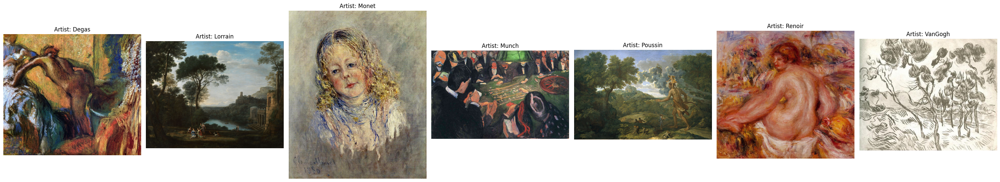

In [131]:
images_arr = []
labels = []

painters = [d for d in os.listdir(train_directory) if os.path.isdir(os.path.join(train_directory, d))]
for painter in painters:
    tr_directory = os.path.join(train_directory, painter)
    image_files = [filename for filename in os.listdir(tr_directory) if filename.endswith('.jpg')]
    if image_files: 
        img = Image.open(os.path.join(tr_directory, image_files[12]))
        images_arr.append(img)
        labels.append("Artist: " + painter)

plotImages(images_arr, labels)

In [3]:
image_transforms = {
    'train': transforms.Compose([
        transforms.RandomRotation(45),
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.2),
        transforms.RandomGrayscale(p=0.1),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'valid': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
}


NameError: name 'transforms' is not defined

In [ ]:
dataset = {
    'train': datasets.ImageFolder(root=train_directory, transform=image_transforms['train']),
    'valid': datasets.ImageFolder(root=valid_directory, transform=image_transforms['valid']),
    'test': datasets.ImageFolder(root=test_directory, transform=image_transforms['test'])
}

dataloaders = {
    'train': DataLoader(dataset['train'], batch_size=32, shuffle=True),
    'valid': DataLoader(dataset['valid'], batch_size=32, shuffle=True),
    'test': DataLoader(dataset['test'], batch_size=32, shuffle=False)
}

In [ ]:
dataset_sizes = {x: len(dataset[x]) for x in ['train', 'valid', 'test']}
class_names = dataset['train'].classes
print("Liczba klas:", len(class_names), "\nKlasy:", class_names)

Classes: ['Degas', 'Lorrain', 'Monet', 'Munch', 'Poussin', 'Renoir', 'VanGogh']


In [8]:
from collections import Counter

class_counts = Counter([label for _, label in dataset['train']])
for idx, count in class_counts.items():
    print(f"Liczba elementów w klasie {class_names[idx]}: {count}")


Liczba elementów w klasie Degas: 469
Liczba elementów w klasie Lorrain: 77
Liczba elementów w klasie Monet: 1025
Liczba elementów w klasie Munch: 146
Liczba elementów w klasie Poussin: 129
Liczba elementów w klasie Renoir: 1059
Liczba elementów w klasie VanGogh: 1447


In [9]:
class_counts_df = pd.DataFrame(list(class_counts.items()), columns=["Class", "Count"])

print(class_counts_df)


   Class  Count
0      0    469
1      1     77
2      2   1025
3      3    146
4      4    129
5      5   1059
6      6   1447


In [137]:
class_counts_df['Class Weight'] = np.log1p(class_counts_df['Count'].sum() / class_counts_df['Count'])

print(class_counts_df)


   Class  Count  Class Weight
0      0    469      2.330134
1      1     77      4.052124
2      2   1025      1.657438
3      3    146      3.427782
4      4    129      3.547789
5      5   1059      1.631109
6      6   1447      1.388193


In [138]:
class_weights = class_counts_df['Class Weight'].to_dict()
class_weights

{0: 2.330133885959343,
 1: 4.052123682069515,
 2: 1.6574379852371697,
 3: 3.4277815108109246,
 4: 3.547789110424471,
 5: 1.6311088520413288,
 6: 1.3881930412449568}

In [12]:
name = os.listdir(train_directory)

In [13]:
name

['Degas', 'Lorrain', 'Monet', 'Munch', 'Poussin', 'Renoir', 'VanGogh']

In [140]:
batch_size = 32
train_input_shape = (224, 224, 3)
n_classes = class_counts_df.shape[0]

# Generator danych treningowych
train_datagen = ImageDataGenerator(
    rescale=1./255.,
    rotation_range=45,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest',
    preprocessing_function=lambda x: x + np.random.normal(loc=0.0, scale=0.1, size=x.shape)
)

# Generator danych walidacyjnych
valid_datagen = ImageDataGenerator(
    rescale=1./255.  
)

# Tworzenie generatorów
train_generator = train_datagen.flow_from_directory(
    directory=train_directory,
    class_mode='categorical',
    target_size=train_input_shape[:2],
    batch_size=batch_size,
    shuffle=True  # Tasowanie danych dla treningu
)

valid_generator = valid_datagen.flow_from_directory(
    directory=valid_directory,
    class_mode='categorical',
    target_size=train_input_shape[:2],
    batch_size=batch_size,
    shuffle=True  # Brak tasowania danych dla walidacji
)

# Obliczanie liczby kroków
STEP_SIZE_TRAIN = train_generator.n // train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n // valid_generator.batch_size

print("Total number of batches =", STEP_SIZE_TRAIN, "and", STEP_SIZE_VALID)


Found 4352 images belonging to 7 classes.
Found 1159 images belonging to 7 classes.
Total number of batches = 136 and 36


In [141]:
test_generator = train_datagen.flow_from_directory(directory=test_directory,
                                                    class_mode='categorical',
                                                    target_size=train_input_shape[:2],
                                                    batch_size=batch_size,
                                                    shuffle=False,
                                                    classes=name
                                                   )

STEP_SIZE_TEST = test_generator.n//test_generator.batch_size

Found 295 images belonging to 7 classes.


In [148]:
from tensorflow.keras.applications import VGG19

base_model = VGG19(weights='imagenet', include_top=False, input_shape=train_input_shape)

for layer in base_model.layers[:-2]:
    layer.trainable = False


In [149]:
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.layers import Conv2D

x = Conv2D(128, (3, 3), activation='relu', padding='same')(base_model.output)
x = BatchNormalization()(x)
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu', kernel_regularizer=l2(0.01))(x)
x = Dropout(0.5)(x)
x = BatchNormalization()(x)
x = Dense(256, activation='relu', kernel_regularizer=l2(0.01))(x)
x = Dropout(0.3)(x)
predictions = Dense(n_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)



In [150]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Precision, Recall

model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

In [151]:
import tensorflow as tf
from sklearn.metrics import f1_score

class F1ScoreCallback(tf.keras.callbacks.Callback):
    def __init__(self, validation_data):
        self.validation_data = validation_data

    def on_epoch_end(self, epoch, logs=None):
        # Pobierz dane walidacyjne
        val_data = self.validation_data[0]
        val_labels = self.validation_data[1]

        # Przewiduj klasy
        val_preds = self.model.predict(val_data)
        val_preds = tf.argmax(val_preds, axis=1)
        val_labels = tf.argmax(val_labels, axis=1)

        # Oblicz F1-Score
        f1 = f1_score(val_labels, val_preds, average='macro')

        # Zapisanie F1-Score w logach
        logs['val_f1_score'] = f1
        print(f"\nEpoch {epoch+1}: F1-Score = {f1:.4f}")

val_data, val_labels = zip(*(next(valid_generator) for _ in range(len(valid_generator))))
val_data = np.vstack(val_data)
val_labels = np.vstack(val_labels)

# Callback
f1_callback = F1ScoreCallback(validation_data=(val_data, val_labels))

In [152]:
early_stop = EarlyStopping(monitor='val_f1_score', patience=7, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_f1_score', factor=0.1, patience=3)
model_checkpoint = ModelCheckpoint('vgg19_model.h5', monitor='val_f1_score', save_best_only=True)

# Trenowanie modelu
STEP_SIZE_TRAIN = train_generator.n // train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n // valid_generator.batch_size

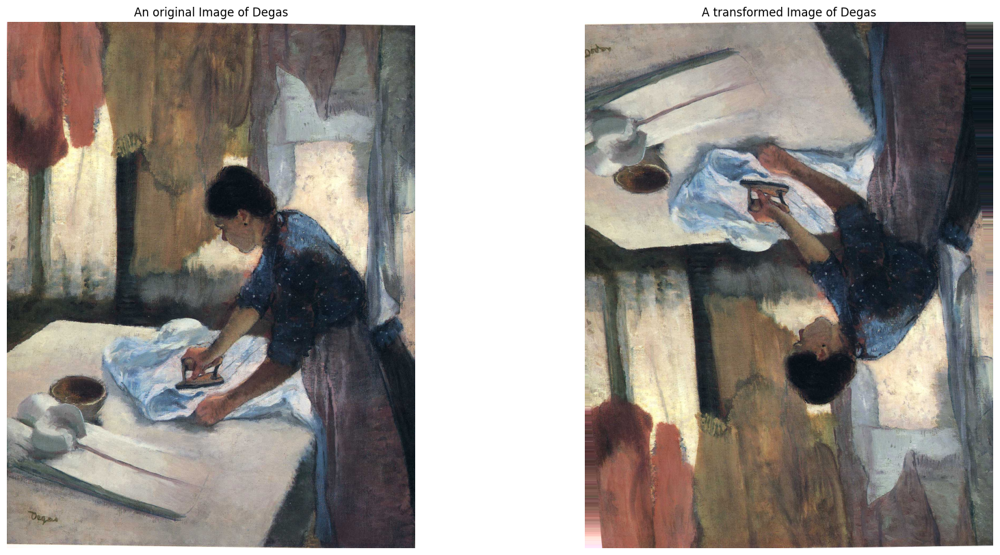

In [58]:
import random

fig, axes = plt.subplots(1, 2, figsize=(20,10))

random_artist = random.choice(name)
random_image = random.choice(os.listdir(os.path.join(train_directory, random_artist)))
random_image_file = os.path.join(train_directory, random_artist, random_image)

image = plt.imread(random_image_file)
axes[0].imshow(image)
axes[0].set_title("An original Image of " + random_artist.replace('_', ' '))
axes[0].axis('off')

aug_image = train_datagen.random_transform(image)
axes[1].imshow(aug_image)
axes[1].set_title("A transformed Image of " + random_artist.replace('_', ' '))
axes[1].axis('off')

plt.show()


In [ ]:
n_epoch = 40

history = model.fit(
    train_generator,
    steps_per_epoch=STEP_SIZE_TRAIN,
    validation_data=valid_generator,
    validation_steps=STEP_SIZE_VALID,
    epochs=n_epoch,
    callbacks=[early_stop, reduce_lr, model_checkpoint, f1_callback],
    class_weight=class_weights
)


Epoch 1/40
37/37 [==============================] - 123s 3s/step

Epoch 1: F1-Score = 0.3442
136/136 [==============================] - 770s 6s/step - loss: 8.3972 - accuracy: 0.4290 - precision_7: 0.5625 - recall_7: 0.2946 - val_loss: 6.6629 - val_accuracy: 0.5807 - val_precision_7: 0.9775 - val_recall_7: 0.0755 - lr: 1.0000e-04 - val_f1_score: 0.3442
Epoch 2/40
37/37 [==============================] - 121s 3s/step

Epoch 2: F1-Score = 0.5330
136/136 [==============================] - 730s 5s/step - loss: 7.4236 - accuracy: 0.6068 - precision_7: 0.7064 - recall_7: 0.4883 - val_loss: 6.1514 - val_accuracy: 0.6502 - val_precision_7: 0.8677 - val_recall_7: 0.3872 - lr: 1.0000e-04 - val_f1_score: 0.5330
Epoch 3/40
37/37 [==============================] - 148s 4s/step

Epoch 3: F1-Score = 0.4945
136/136 [==============================] - 804s 6s/step - loss: 7.0542 - accuracy: 0.6229 - precision_7: 0.7126 - recall_7: 0.5299 - val_loss: 6.0175 - val_accuracy: 0.6024 - val_precision_7: 0.666

In [122]:
results = model.evaluate(test_generator, steps=test_generator.n // batch_size)
print(results)

36/36 [==============================] - 32s 868ms/step - loss: 0.7265 - accuracy: 0.8438 - precision_5: 0.8769 - recall_5: 0.8160
[0.7264891266822815, 0.84375, 0.8768656849861145, 0.8159722089767456]


In [123]:
# Przewidywanie klas na zbiorze testowym
test_preds = model.predict(test_generator)  # Automatycznie pokryje wszystkie próbki
test_preds = tf.argmax(test_preds, axis=1)

# Pobranie prawdziwych etykiet ze zbioru testowego
test_labels = []
for i in range(len(test_generator)):
    _, labels = test_generator[i]
    test_labels.extend(labels)

test_labels = np.array(test_labels)[:len(test_preds)]  # Dopasowanie liczby próbek
test_labels = tf.argmax(test_labels, axis=1)

# Obliczenie F1-Score
test_f1_score = f1_score(test_labels, test_preds, average='macro')
print(f"Test F1-Score: {test_f1_score:.4f}")

37/37 [==============================] - 38s 1s/step
Test F1-Score: 0.7799


In [125]:
from sklearn.metrics import classification_report

print(classification_report(test_labels, test_preds))


              precision    recall  f1-score   support

           0       0.65      0.75      0.70        32
           1       0.75      1.00      0.86         6
           2       0.81      0.94      0.87        69
           3       0.56      0.50      0.53        10
           4       0.88      0.70      0.78        10
           5       0.91      0.82      0.86        71
           6       0.91      0.84      0.87        97

    accuracy                           0.83       295
   macro avg       0.78      0.79      0.78       295
weighted avg       0.84      0.83      0.83       295



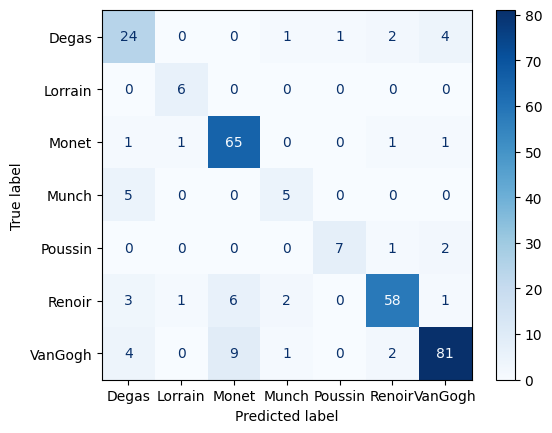

In [126]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(test_labels, test_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_generator.class_indices.keys())
disp.plot(cmap='Blues')


In [127]:
test_f1_weighted = f1_score(test_labels, test_preds, average='weighted')
print(f"Weighted F1-Score: {test_f1_weighted:.4f}")


Weighted F1-Score: 0.8344


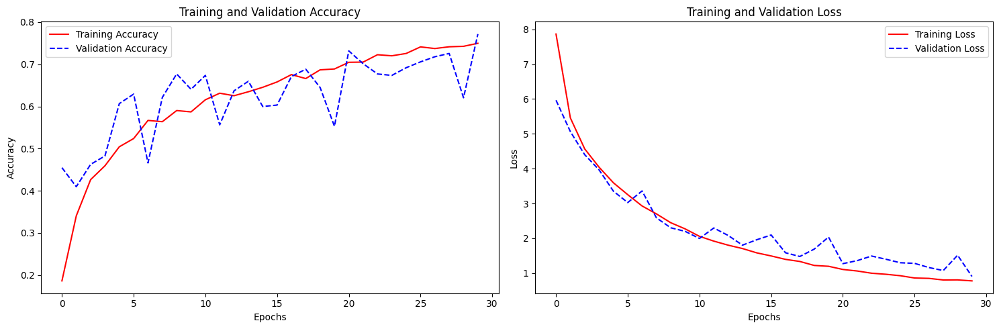

In [124]:
import matplotlib.pyplot as plt

def plot_training_with_f1(history):
    # Uzyskanie metryk z history.history
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    # Dodanie F1-Score, jeśli jest obecny w historii
    f1 = history.history.get('f1_score', None)
    val_f1 = history.history.get('val_f1_score', None)
    
    epochs = range(len(acc))

    # Tworzenie wykresów
    fig, axes = plt.subplots(1, 3 if f1 is not None else 2, figsize=(20 if f1 is not None else 15, 5))

    # Wykres dokładności
    axes[0].plot(epochs, acc, 'r-', label='Training Accuracy')
    axes[0].plot(epochs, val_acc, 'b--', label='Validation Accuracy')
    axes[0].set_title('Training and Validation Accuracy')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].legend(loc='best')

    # Wykres straty
    axes[1].plot(epochs, loss, 'r-', label='Training Loss')
    axes[1].plot(epochs, val_loss, 'b--', label='Validation Loss')
    axes[1].set_title('Training and Validation Loss')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].legend(loc='best')

    # Wykres F1-Score, jeśli dostępny
    if f1 is not None and val_f1 is not None:
        axes[2].plot(epochs, f1, 'r-', label='Training F1-Score')
        axes[2].plot(epochs, val_f1, 'b--', label='Validation F1-Score')
        axes[2].set_title('Training and Validation F1-Score')
        axes[2].set_xlabel('Epochs')
        axes[2].set_ylabel('F1-Score')
        axes[2].legend(loc='best')

    plt.tight_layout()
    plt.show()

# Wywołanie funkcji
plot_training_with_f1(history)



1/1 [==============================] - 1s 1s/step


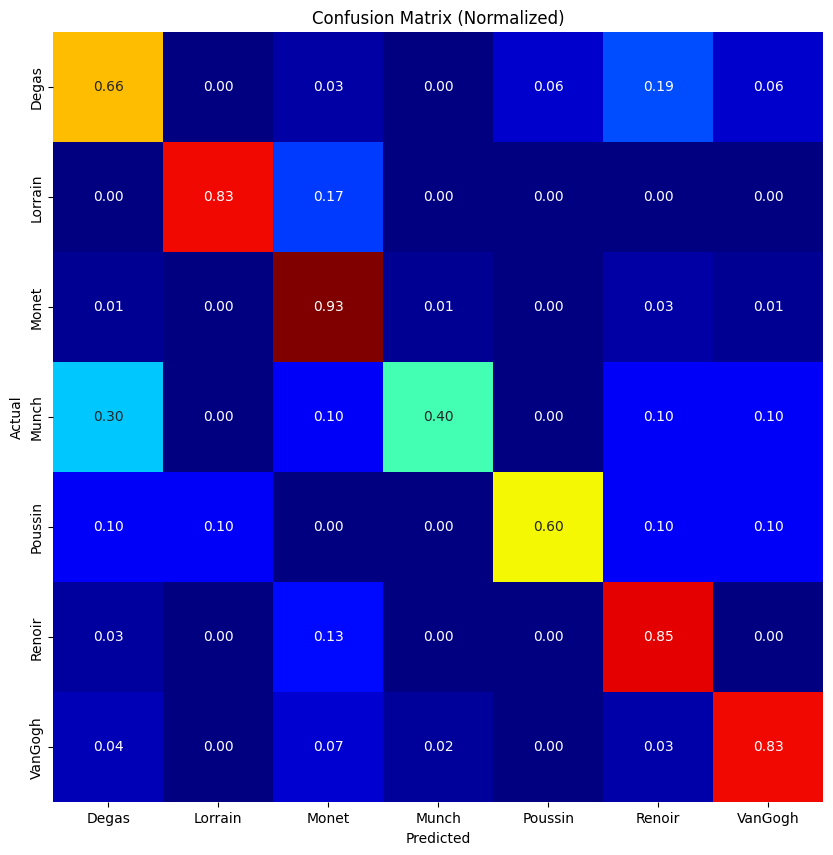

Raw Confusion Matrix:
 [[21  0  1  0  2  6  2]
 [ 0  5  1  0  0  0  0]
 [ 1  0 64  1  0  2  1]
 [ 3  0  1  4  0  1  1]
 [ 1  1  0  0  6  1  1]
 [ 2  0  9  0  0 60  0]
 [ 4  0  6  2  0  3 75]]
Classification Report:
              precision    recall  f1-score   support

       Degas       0.66      0.66      0.66        32
     Lorrain       0.83      0.83      0.83         6
       Monet       0.78      0.93      0.85        69
       Munch       0.57      0.40      0.47        10
     Poussin       0.75      0.60      0.67        10
      Renoir       0.82      0.85      0.83        71
     VanGogh       0.94      0.83      0.88        90

    accuracy                           0.82       288
   macro avg       0.76      0.73      0.74       288
weighted avg       0.82      0.82      0.81       288



In [79]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

tick_labels = name

def showClassficationReport_Generator(model, test_generator, STEP_SIZE_TEST):
    y_pred, y_true = [], []

    # Iteracja przez generator
    for i in range(STEP_SIZE_TEST):
        (X, y) = next(test_generator)
        y_pred.append(model.predict(X))
        y_true.append(y)
    
    # Rozwijanie wyników batchy w pojedyncze listy
    y_pred = [subresult for result in y_pred for subresult in result]
    y_true = [subresult for result in y_true for subresult in result]
    
    # Konwersja do indeksów klas (z one-hot encoded)
    y_true = np.argmax(y_true, axis=1)
    y_pred = np.argmax(y_pred, axis=1)
    
    # Dopasowanie długości, jeśli generator zwrócił niepełny ostatni batch
    y_pred = y_pred[:len(y_true)]

    # Macierz konfuzji
    fig, ax = plt.subplots(figsize=(10, 10))
    conf_matrix = confusion_matrix(y_true, y_pred, labels=np.arange(n_classes))
    row_sums = conf_matrix.sum(axis=1, keepdims=True)
    conf_matrix_normalized = conf_matrix / row_sums  # Normalizacja do wartości procentowych

    sns.heatmap(conf_matrix_normalized, annot=True, fmt=".2f", square=True, cbar=False, 
                cmap=plt.cm.jet, xticklabels=tick_labels, yticklabels=tick_labels, ax=ax)
    ax.set_ylabel('Actual')
    ax.set_xlabel('Predicted')
    ax.set_title('Confusion Matrix (Normalized)')
    plt.show()

    # Surowa macierz konfuzji (opcjonalnie, jeśli chcesz liczby zamiast procentów)
    print("Raw Confusion Matrix:\n", conf_matrix)

    # Raport klasyfikacji
    print('Classification Report:')
    print(classification_report(y_true, y_pred, labels=np.arange(n_classes), target_names=tick_labels))

# Wywołanie funkcji
showClassficationReport_Generator(model, test_generator, STEP_SIZE_TEST)


In [ ]:
model.save('ResNet50.h5')
print("Model saved successfully.")

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

In [97]:
import gzip
import shutil

with open('ResNet50.h5', 'rb') as f_in:
    with gzip.open('ResNet50.h5.gz', 'wb') as f_out:
        shutil.copyfileobj(f_in, f_out)
print(f"Model compressed and saved as {'ResNet50.h5.gz'}")

Model compressed and saved as ResNet50.h5.gz


In [98]:
import joblib 

joblib.dump(history1.history, 'history1.pkl')
print("Training history saved successfully.")

Training history saved successfully.


In [99]:
for layer in model.layers:
    layer.trainable = False

for layer in model.layers[:50]:
    layer.trainable = True

optimizer = Adam(learning_rate=0.0001)

model.compile(loss='categorical_crossentropy',
              optimizer=optimizer, 
              metrics=['accuracy'])

n_epoch = 30
history2 = model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,
                              validation_data=valid_generator, validation_steps=STEP_SIZE_VALID,
                              epochs=n_epoch,
                              shuffle=True,
                              verbose=1,
                              callbacks=[reduce_lr, early_stop],
                              use_multiprocessing=False,
                              workers=16,
                              class_weight=class_weights
                             ) 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0


C:\Users\Administrator\AppData\Local\Temp\ipykernel_7680\320717651.py:14: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history2 = model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,


Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in dev

In [100]:
model.save('ResNet50_2.h5')
print("Model saved successfully.")

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

In [101]:
joblib.dump(history2.history, 'history2.pkl')
print("Training history saved successfully.")

Training history saved successfully.


In [102]:
import gzip
import shutil

gz_model_path = 'ResNet50_2.h5.gz'

with open('ResNet50_2.h5', 'rb') as f_in:
    with gzip.open(gz_model_path, 'wb') as f_out:
        shutil.copyfileobj(f_in, f_out)
print(f"Model compressed and saved as {gz_model_path}")

Model compressed and saved as ResNet50_2.h5.gz


In [103]:
import joblib

history1 = joblib.load('history1.pkl')
print("Training history loaded successfully.")

Training history loaded successfully.


In [104]:
import joblib

history2 = joblib.load('history2.pkl')
print("Training history loaded successfully.")


Training history loaded successfully.


In [105]:
import pickle

with open('history1.pkl', 'rb') as file:
    loaded_history1 = pickle.load(file)
print("Training history loaded successfully.")

import pickle

with open('history2.pkl', 'rb') as file:
    loaded_history2 = pickle.load(file)
print("Training history loaded successfully.")

Training history loaded successfully.
Training history loaded successfully.


In [106]:
history = {}
history['loss'] = loaded_history1['loss'] + loaded_history2['loss']
history['accuracy'] = loaded_history1['accuracy'] + loaded_history2['accuracy']
history['val_loss'] = loaded_history1['val_loss'] + loaded_history2['val_loss']
history['val_accuracy'] = loaded_history1['val_accuracy'] + loaded_history2['val_accuracy']
history['lr'] = loaded_history1['lr'] + loaded_history2['lr']

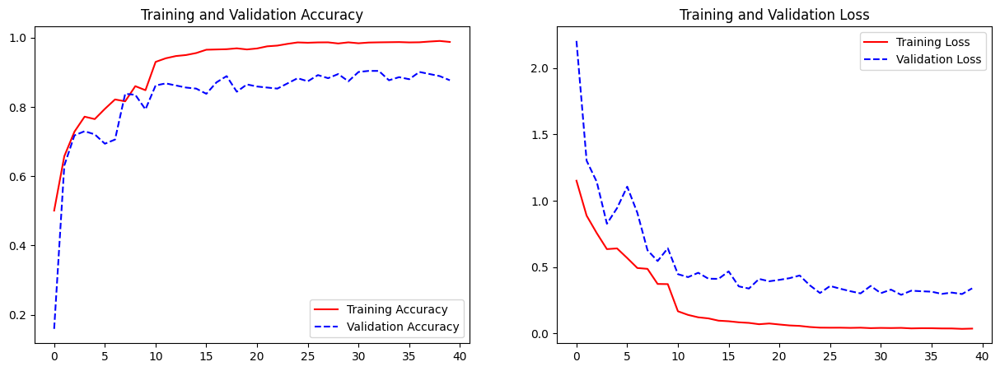

In [107]:
def plot_training(history):
    acc = history['accuracy']
    val_acc = history['val_accuracy']
    loss = history['loss']
    val_loss = history['val_loss']
    epochs = range(len(acc))

    fig, axes = plt.subplots(1, 2, figsize=(15,5))
    
    axes[0].plot(epochs, acc, 'r-', label='Training Accuracy')
    axes[0].plot(epochs, val_acc, 'b--', label='Validation Accuracy')
    axes[0].set_title('Training and Validation Accuracy')
    axes[0].legend(loc='best')

    axes[1].plot(epochs, loss, 'r-', label='Training Loss')
    axes[1].plot(epochs, val_loss, 'b--', label='Validation Loss')
    axes[1].set_title('Training and Validation Loss')
    axes[1].legend(loc='best')
    
    plt.show()
    
plot_training(history)

In [108]:
from tensorflow.keras.models import load_model

temp_model_path = 'ResNet50_2.h5'
gz_model_path = 'ResNet50_2.h5.gz'

with gzip.open(gz_model_path, 'rb') as f_in:
    with open(temp_model_path, 'wb') as f_out:
        shutil.copyfileobj(f_in, f_out)
print(f"Model decompressed to temporary file {temp_model_path}")

model = load_model(temp_model_path)
print("Model loaded successfully from decompressed file.")

Model decompressed to temporary file ResNet50_2.h5
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

In [109]:
# Prediction accuracy on train data
score = model.evaluate_generator(train_generator, verbose=1)
print("Prediction accuracy on train data =", score[1])

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0


C:\Users\Administrator\AppData\Local\Temp\ipykernel_7680\4076090939.py:2: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  score = model.evaluate_generator(train_generator, verbose=1)


Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV

In [110]:
# Prediction accuracy on CV data
score = model.evaluate_generator(valid_generator, verbose=1)
print("Prediction accuracy on CV data =", score[1])

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0


C:\Users\Administrator\AppData\Local\Temp\ipykernel_7680\2117339602.py:2: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  score = model.evaluate_generator(valid_generator, verbose=1)


Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIter

In [111]:
# Prediction accuracy test data
score = model.evaluate_generator(test_generator, verbose=1)
print("Dokładność klasyfikacji = {:.2f}%".format(score[1] * 100))

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0


C:\Users\Administrator\AppData\Local\Temp\ipykernel_7680\1995393921.py:2: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  score = model.evaluate_generator(test_generator, verbose=1)


Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Anonymous

In [112]:
from tensorflow.keras.models import load_model
loaded_model = load_model("RESNET50_2.h5")

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

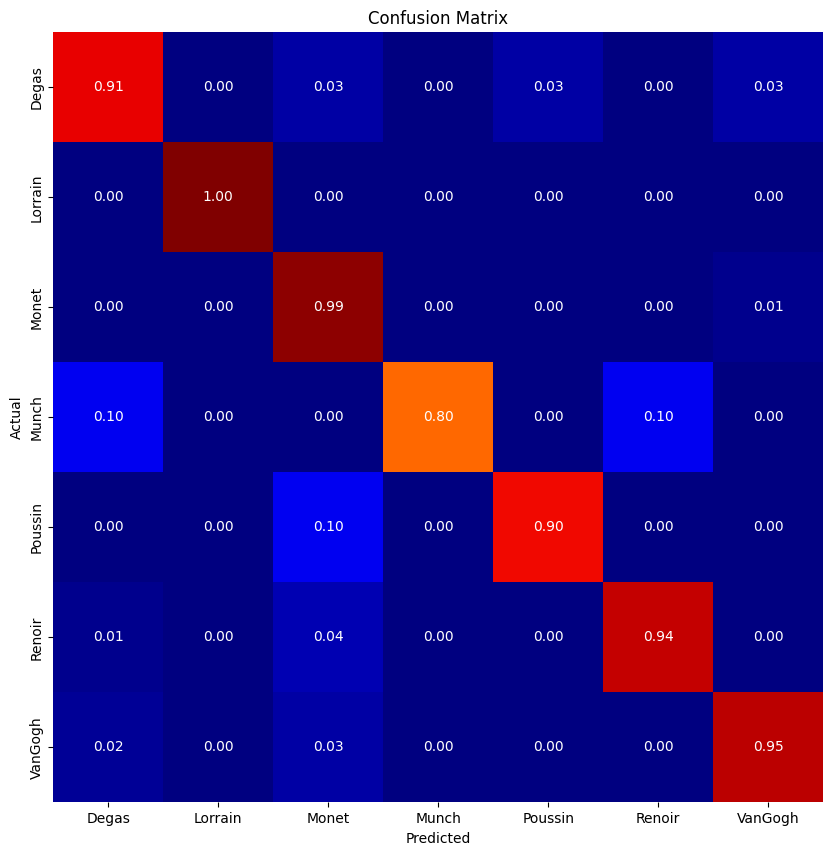

Classification Report:
              precision    recall  f1-score   support

       Degas       0.88      0.91      0.89        32
     Lorrain       1.00      1.00      1.00         6
       Monet       0.89      0.99      0.94        69
       Munch       1.00      0.80      0.89        10
     Poussin       0.90      0.90      0.90        10
      Renoir       0.98      0.94      0.96        68
     VanGogh       0.98      0.95      0.96        93

    accuracy                           0.94       288
   macro avg       0.95      0.93      0.93       288
weighted avg       0.95      0.94      0.94       288



In [113]:
# Classification report and confusion matrix
from sklearn.metrics import *
import seaborn as sns

tick_labels = name.tolist()

def showClassficationReport_Generator(model, test_generator, STEP_SIZE_TEST):
    y_pred, y_true = [], []
    for i in range(STEP_SIZE_TEST):
        (X,y) = next(test_generator)
        y_pred.append(model.predict(X))
        y_true.append(y)
    
    y_pred = [subresult for result in y_pred for subresult in result]
    y_true = [subresult for result in y_true for subresult in result]
    
    y_true = np.argmax(y_true, axis=1)
    y_true = np.asarray(y_true).ravel()
    
    y_pred = np.argmax(y_pred, axis=1)
    y_pred = np.asarray(y_pred).ravel()
    
    fig, ax = plt.subplots(figsize=(10, 10))
    conf_matrix = confusion_matrix(y_true, y_pred, labels=np.arange(n_classes))
    row_sums = conf_matrix.sum(axis=1, keepdims=True)
    conf_matrix = conf_matrix / row_sums 
    sns.heatmap(conf_matrix, annot=True, fmt=".2f", square=True, cbar=False, 
                cmap=plt.cm.jet, xticklabels=tick_labels, yticklabels=tick_labels,
                ax=ax)
    ax.set_ylabel('Actual')
    ax.set_xlabel('Predicted')
    ax.set_title('Confusion Matrix')
    plt.show()
    
    print('Classification Report:')
    print(classification_report(y_true, y_pred, labels=np.arange(n_classes), target_names=name.tolist()))

showClassficationReport_Generator(loaded_model, test_generator, STEP_SIZE_TEST)


Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

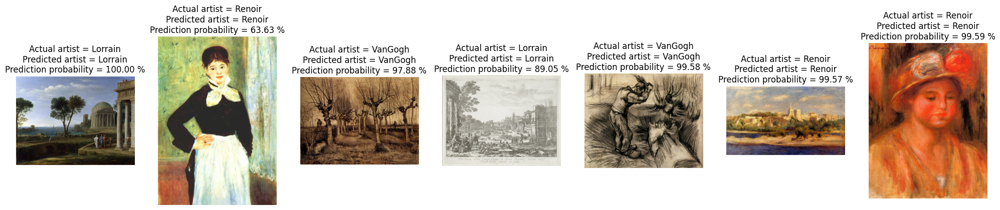

In [114]:
# Prediction
from keras.preprocessing import *
from tensorflow.keras.preprocessing.image import load_img, img_to_array

n = 7
fig, axes = plt.subplots(1, n, figsize=(25,10))

for i in range(n):
    random_artist = random.choice(name)
    random_image = random.choice(os.listdir(os.path.join(test_directory, random_artist)))
    random_image_file = os.path.join(test_directory, random_artist, random_image)


    # test_image = image.load_img(random_image_file, target_size=(train_input_shape[0:2]))
    test_image = load_img(random_image_file, target_size=(train_input_shape[0:2]))


    test_image = img_to_array(test_image)
    test_image /= 255.
    test_image = np.expand_dims(test_image, axis=0)

    prediction = model.predict(test_image)
    prediction_probability = np.amax(prediction)
    prediction_idx = np.argmax(prediction)

    labels = train_generator.class_indices
    labels = dict((v,k) for k,v in labels.items())

    #print("Actual artist =", random_artist.replace('_', ' '))
    #print("Predicted artist =", labels[prediction_idx].replace('_', ' '))
    #print("Prediction probability =", prediction_probability*100, "%")

    title = "Actual artist = {}\nPredicted artist = {}\nPrediction probability = {:.2f} %" \
                .format(random_artist.replace('_', ' '), labels[prediction_idx].replace('_', ' '),
                        prediction_probability*100)

    # Print image
    axes[i].imshow(plt.imread(random_image_file))
    axes[i].set_title(title)
    axes[i].axis('off')

plt.show()

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

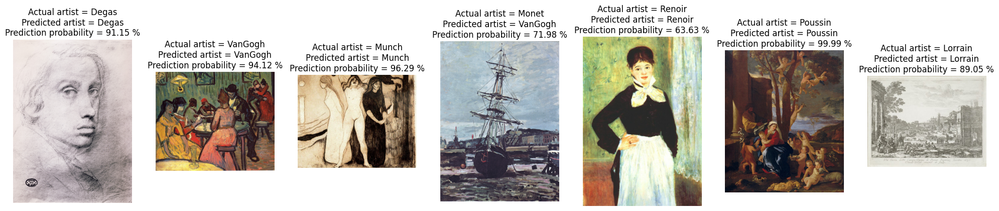

In [115]:
from keras.preprocessing import image
import random
import os
import matplotlib.pyplot as plt
import numpy as np

n = 7
fig, axes = plt.subplots(1, n, figsize=(25, 10))

unique_artists = set()

while len(unique_artists) < n:
    random_artist = random.choice(name)
    unique_artists.add(random_artist)

for i, random_artist in enumerate(unique_artists):
    random_image = random.choice(os.listdir(os.path.join(test_directory, random_artist)))
    random_image_file = os.path.join(test_directory, random_artist, random_image)

    test_image = load_img(random_image_file, target_size=(train_input_shape[0], train_input_shape[1]))

    test_image = img_to_array(test_image)
    test_image /= 255.
    test_image = np.expand_dims(test_image, axis=0)

    prediction = model.predict(test_image)
    prediction_probability = np.amax(prediction)
    prediction_idx = np.argmax(prediction)

    labels = train_generator.class_indices
    labels = dict((v, k) for k, v in labels.items())

    title = "Actual artist = {}\nPredicted artist = {}\nPrediction probability = {:.2f} %" \
        .format(random_artist.replace('_', ' '), labels[prediction_idx].replace('_', ' '), prediction_probability * 100)

    # Display the image
    axes[i].imshow(plt.imread(random_image_file))
    axes[i].set_title(title)
    axes[i].axis('off')

plt.show()
